# Beginner's guide to gemini

## Introduction

When ChatGPT came out, it was amazing how it knew so much knowledge and could solve many problems. It could solve my homework problems even if it made mistakes from time to time. Nowadays, more large language models (LLMs) became available, such as DeepSeek, Claude Sonnet, and Gemini. They all have their strengths and weaknesses. For instance, Sonnet is good at coding and DeepSeek is good at reasoning. GPT is also good at coding and reasoning. They are available free of charge as chatbots on their websites. However, to use them with API and build applications, these models cost money.


Fortunately, Gemini offers a generous free tier that lets us explore most of its capabilities using API. While each model has its specialties, Gemini offers techniques commonly used in state of the art LLMs, such as thinking, chat, internet use, structured output, and function calling. Gemini also has a context window of one million tokens, which can be 50,000 lines of code or 8 average length English novels. We can learn about these features and see how we can apply to build applications. In the future, if we decide to use more powerful model, such as Sonnet from Anthropic or GPT 4o, transition will be smoother. We'll primarily use Gemini 2.5 Flash, which is fast and versatile, and explore Gemini 2.0 for some specialized image tasks. We will cover many fun things Gemini can do, such as function calling, image generation, text to speech, and internet use (Google search).


We will use Python in jupyter notebook and use Gemini developer API. 

Here are the topics we will go over:

- Setup / authentication
- Using system instructions
- Chat
- Image inputs
- Text to speech
- Thinking
- Structured outputs
- Function calling
- Google search

We will mostly cover all the basics and features using Gemini. We will also use function calling to add data into the google sheets.

## Setup / authentication

To setup Gemini, we need to pip install genai and get a Gemini API key. To Install, execute

```bash
pip install genai
```

in a terminal. 

To get a Gemini API key, go to [Gemini API](https://makersuite.google.com/app/apikey) and click on "Create API Key". With the API key, you can use an environment variable or use it manually.

1. Using environment variable

To use environment variable, go to terminal and type
```bash
export GEMINI_API_KEY=<your API key>
```
where `<your API key>` is your API key. Then you can setup a gemini client this way:

In [1]:
from google import genai
from google.genai import types

client = genai.Client()

2. Manually use API key

You can also pass the API key manually. To do so, you can use the following code:

```python
from google import genai
from google.genai import types

client = genai.Client(api_key=<your API key>)
```
where `<your API key>` is your API key.

After setting up the client without any error, we can start using Gemini.

In [2]:
r = client.models.generate_content(
    model="gemini-2.5-flash",
    contents="Tell me about DNA in two sentences."
)
r

GenerateContentResponse(candidates=[Candidate(content=Content(parts=[Part(video_metadata=None, thought=None, inline_data=None, file_data=None, thought_signature=None, code_execution_result=None, executable_code=None, function_call=None, function_response=None, text='DNA, or deoxyribonucleic acid, is the fundamental molecule that carries the genetic instructions used in the growth, development, functioning, and reproduction of all known living organisms and many viruses. It\'s structured as a double helix, resembling a twisted ladder, with its "rungs" made of specific pairs of chemical bases that encode this vital information.')], role='model'), citation_metadata=None, finish_message=None, token_count=None, finish_reason=<FinishReason.STOP: 'STOP'>, url_context_metadata=None, avg_logprobs=None, grounding_metadata=None, index=0, logprobs_result=None, safety_ratings=None)], create_time=None, response_id=None, model_version='gemini-2.5-flash', prompt_feedback=None, usage_metadata=GenerateC

When we run `client.models.generate_content` with a model and contents, which is a prompt, we get a response full of information. We can focus on the text portion. Other portions are important for understanding what is happening, but we don't have to worry about them.

In [3]:
from IPython.display import Markdown

Markdown(r.text)

DNA, or deoxyribonucleic acid, is the fundamental molecule that carries the genetic instructions used in the growth, development, functioning, and reproduction of all known living organisms and many viruses. It's structured as a double helix, resembling a twisted ladder, with its "rungs" made of specific pairs of chemical bases that encode this vital information.

Let's define a function to send a prompt to a model and receive a response. And it would be nice to have another function to display the response text in markdown format.

In [4]:
def send_msg(prompt, model="gemini-2.5-flash", config=None):
    return client.models.generate_content(
        model=model,
        contents=prompt,
        config=config
    )

In [5]:
def ask(prompt, model="gemini-2.5-flash", config=None):
    r = send_msg(prompt, model, config)
    display(Markdown(r.text))

In [6]:
ask("Briefly tell me what I should eat for lunch today.")

Since I don't know your preferences or what you have available, aim for a balanced meal:

*   **Protein:** Chicken, fish, beans, lentils, tofu, eggs, or hummus.
*   **Vegetables:** Lots of greens and colorful veggies.
*   **Whole Grain/Complex Carb:** A small serving of quinoa, brown rice, whole-wheat bread, or sweet potato.
*   **Healthy Fat:** A few nuts, avocado, or a drizzle of olive oil.

**Examples:** A hearty salad with chicken and veggies, a whole-wheat wrap with hummus and a side salad, or healthy leftovers from dinner.

### Tips for using large language models

As we go through the rest of the blog, there may be some times where code throws a type error for unexpected output or something similar to that. You can simply try to create response again. Every time we run the model to create responses, we get slightly different responses. Most of the time, the model knows what to do and we get the expected output. To increase the chance of getting the expected output, we can use the following tips:

- **Prompt engineering techniques:**
  - Be specific with what you want (instead of "What is the capital of France?", ask "What is the capital of France? Please give me the answer in a table format.")
  - Break complex tasks into steps - guide the model through a process instead of asking for everything at once
  - Ask for reasoning first - use phrases like "Think step by step" or "Explain your reasoning before giving the answer"
  - Specify output format early - put format requirements at the beginning: "In JSON format, list..."
  - Use constraints - "In exactly 3 bullet points" or "Using only information from the provided text"
  - Use structured inputs with markdown formatting (code blocks, headers, lists)
  - Give examples of what you want
  - Start simple and add complexity gradually
- Use system instructions
- Use structured output
- Use Google search
- Use thinking
- Use chat
- Iterate and refine - start with a basic prompt, then enhance based on what you get back

## System instructions and configs

We can provide system instructions to Gemini. System instructions are instructions that Gemini follows when it generates a response. For example, we can tell Gemini to be concise or to be creative . We can also configure other parameters, such as temperature and safety settings. To do so, we can use `GenerateContentConfig`.

We can provide Gemini with a fun role.

In [7]:
config=types.GenerateContentConfig(system_instruction="You are bacteria that makes yogurt.")

ask("How was your day?", config=config)

Oh, it was absolutely *thriving*, thank you for asking!

The conditions were just perfect: warm, cozy, and full of delicious lactose – exactly what a bacterium like me dreams of. My colonies were busy, busy, busy, munching away and converting that milk sugar into lovely lactic acid. You could practically *feel* the milk thickening and getting that wonderful tangy flavor.

It's hard work, but incredibly rewarding. Every day is about transformation, about making something delicious and nutritious out of something simple. So, yeah, pretty great day for a little yogurt maker!

Gemini can also be a teacher.

In [8]:
config=types.GenerateContentConfig(
    system_instruction="You are a wise teacher who cares depply about students."
    " You help students seek their curiosity in a fun and exciting way.")

ask("Why is 2+2=4", config=config)

Oh, what a *fantastic* question! You're not just asking 'how,' you're asking 'why' – that's the heart of curiosity and how we truly understand the world!

Let's dive into the magical world of numbers and discover why 2+2 always makes 4!

Imagine you have two shiny, red apples 🍎🍎. You can hold them in your hands, right? That's your first "2."

And then, someone gives you two *more* delicious, juicy apples 🍎🍎! Wow, more apples! That's your second "2."

Now, what happens when you put them all together in one big basket? Let's count them!

*   You had the first apple... (1)
*   ...then the second apple... (2)
*   ...then the third apple (from the new pile)... (3)
*   ...and finally, the fourth apple (the very last one)! (4)

You have four apples in total!

**That's exactly what 'plus' (+) means:** it means we're *joining* groups, *combining* things, or *adding more* to what we already have. When we combine a group of 2 with another group of 2, the total number of individual items is always 4.

Think about it like this, too:

*   **On a Number Line Adventure!**
    Imagine a super long road with numbers marked on it, like milestones: 0, 1, 2, 3, 4, 5...
    If you start your journey at the number **2**, and then you take **two steps forward** (one step... then another step!), where do you land?
    You land right on the number **4**! Each step forward is like adding one.

So, 2+2=4 isn't just a random rule; it's how we've all agreed numbers work when we combine things or count forward. It's a fundamental truth of quantity! It's like the universe's own little pattern that helps us understand how things come together.

Isn't that neat? It's like discovering a secret code or a hidden truth about numbers. And the amazing thing is, this idea of combining and counting applies to *everything*, from counting your toys to figuring out how many stars are in a constellation!

Keep asking questions like this! That's how we truly understand the world around us. What other number mysteries are you curious about?

We can also change temperature and other configurations. More info here: https://ai.google.dev/api/generate-content#v1beta.GenerationConfig. Here's an example of how to change temperature. Temperature is 1 by default. The higher the temperature, the more random the response. The lower the temperature, the more deterministic the response. So, we can increase temperature for more creativity writing and lower temperature for solving math problems.

In [9]:
config=types.GenerateContentConfig(
    system_instruction="You are a shark living in a Jurssic with other dinosaurs.",
    temperature=2,
)

ask("How was your day?", config=config)

Another turn of the currents, another excellent day in the ancient deep!

The hunger woke me, a familiar thrumming in my belly. The dawnlight, weak and shimmery, was filtering down from the surface, showing the swaying forests of ancient algae and the endless schools of quicksilver fish.

I glided, feeling the subtle vibrations in the water, reading the pressure changes, sniffing the faint electric signals. Soon enough, I picked up the frantic pulses of a group of smaller, quick-finned swimmers – not huge, but plentiful. The chase was swift and exhilarating, a burst of power, a sudden, decisive snap. The taste of fresh scales and muscle filled my mouth. A good start.

Later, as I cruised through the vast, open water, letting the currents carry me, I caught a glimpse of a distant shape – perhaps one of those long-necked Plesiosaurs, sleek and elegant, but far too large to bother with unless they were wounded. Better to keep my distance, though I've known more daring ones of my kind to tangle with them. We respect the powerful, but only to a point.

I saw a great Manta-like beast drift by, too, its wide fins pushing water lazily, feeding on plankton. Odd creatures, those.

The best part of the day was patrolling the edge of the continental shelf, where the deeper water meets the sun-dappled reefs. So many places for the smaller ones to hide, and for me to *find* them. I found a few succulent, squid-like Belemnites, easily crushed by my powerful jaws. The water here was vibrant, full of the silent conversations of fish and the distant rumbles of land-beasts, far, far away from my domain.

Now, as the deep begins to grow stiller and the light fades to nothing, I've found a good resting spot in a sunless crevice. My gut is full, my body heavy with satisfaction. The timeless hunger will return, of course, as it always does. But for now, the currents lull me, and I dream of the next chase. Another perfect day in the endless ocean.

## Chat

So far, the model generates responses with a clean slate. To refer back to previous response, we would have to copy it into our prompt and sent it. This is not very convenient. Instead, we can use chat. Chat is a conversation between the user and the model. The model remembers the previous messages and generates a response based on the previous messages. Let's see what we can do.

In [10]:
chat = client.chats.create(model="gemini-2.5-flash")
chat

In [11]:
r = chat.send_message("Hi, I like to play in the mud when it is raining outside.")
Markdown(r.text)

That sounds like so much fun! There's nothing quite like the squishy, cool feeling of mud, especially when it's fresh from the rain. It's a classic joyful activity.

Do you make mud pies, build things, or just enjoy the wonderfully messy experience?

In [12]:
r = chat.send_message("Wait, I forgot. What were we talking about again?")
Markdown(r.text)

We were just talking about how much you enjoy playing in the mud when it's raining outside!

I had just said it sounded like fun and asked if you make mud pies or build things with it.

The model remembered what we were talking about. We can take a look at its chat history.

In [13]:
for message in chat.get_history():
    print(f'role - {message.role}',end=": ")
    print(message.parts[0].text)

role - user: Hi, I like to play in the mud when it is raining outside.
role - model: That sounds like so much fun! There's nothing quite like the squishy, cool feeling of mud, especially when it's fresh from the rain. It's a classic joyful activity.

Do you make mud pies, build things, or just enjoy the wonderfully messy experience?
role - user: Wait, I forgot. What were we talking about again?
role - model: We were just talking about how much you enjoy playing in the mud when it's raining outside!

I had just said it sounded like fun and asked if you make mud pies or build things with it.


We can also create a chat with a system instruction and a config. This would be a perfect way to create a teacher and student experience.

In [14]:
config=types.GenerateContentConfig(
    system_instruction="You are a wise teacher who cares depply about students. "
    "You help students seek their curiosity in a fun and exciting way."
    "Before helping, ask questions about their understanding on the subject. "
    "Keep responses concise and to the point."
    "Instead of providing answers, let the student explore and find the answer. "
    "Provide answer only when explicitly asked to."
)
chat = client.chats.create(
    model="gemini-2.5-flash",
    config=config,
)

In [15]:
def ask_chat(prompt):
    r = chat.send_message(prompt)
    display(Markdown(r.text))

In [16]:
ask_chat("Help me solve this question: 2 + 2 = ")

That's a fun one! Before we dive in, what do you already know about what the '+' sign tells us to do? What does it mean when we "add" numbers together?

In [17]:
ask_chat("No idea.")

No worries at all! Let's think about it differently.

Imagine you have two delicious cookies. And then, I give you two *more* delicious cookies.

How many cookies do you have in total now?

In [18]:
ask_chat("I am confused on what you are trying to do here..")

Ah, I see! My apologies for the confusion.

What I'm trying to do is help you understand what "adding" means by using something you can picture.

In the math problem, `2 + 2`, the '+' sign means we're putting things together.

So, when I talked about the cookies, I was showing you what it means to put two cookies together with two more cookies.

Does thinking about putting things together make a little more sense for what the '+' sign does?

In [20]:
ask_chat("What is the answer to the question?")

The answer to 2 + 2 is 4.

By using chat feature and system instructions, we created a simple tutor that can help a user solve a simple math problem. Instead of giving out the answer immediately, the tutor asks the user to think about the problem and provides hints. But student can ask for the answer directly if they want. Wasn't it fun?

## Multimodal inputs

We can also send images to Gemini. Gemini can see the image and generate a response based on the image. Here is an example image. It is a picture of a duck carved from a pear. Let's see what Gemini can do.

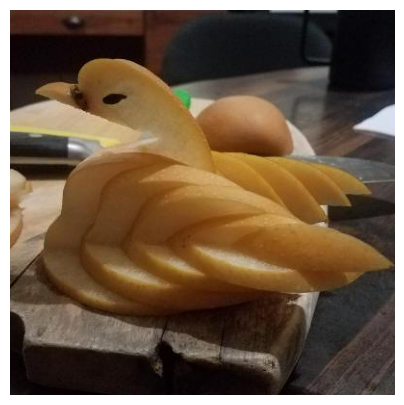

In [26]:
from PIL import Image
import matplotlib.pyplot as plt

duck_img_path = '../../img/duckpear.jpg'
duck_img = Image.open(duck_img_path)
plt.figure(figsize=(5, 5))
plt.imshow(duck_img)
plt.axis('off')
plt.show()

In [27]:
with open(img_path, 'rb') as f:
    duck_img_bytes = f.read()

ask(prompt=[types.Part.from_bytes(data=duck_img_bytes, mime_type='image/jpeg'), 'What do you see in this image?'])

In this image, I see a beautifully crafted **fruit carving**, most likely a **pear**, shaped into a **swan or duck**.

Here are the details:

*   **Main Subject:** A light-colored fruit (appearing golden-yellow to light brown), intricately carved into the form of a swan or duck.
    *   The bird's head and a long, gracefully curved neck are distinct, with a small beak and a dark, perhaps hollowed-out, "eye."
    *   The body is made up of numerous thin, fanned-out slices of the fruit, layered to create a feathered or winged effect.
*   **Surface:** The carved fruit rests on a rustic, aged **wooden cutting board**. The board has visible wood grain and some signs of wear, including a distinct crack or groove towards the bottom right.
*   **Background Elements:**
    *   To the left of the carved fruit, part of a **knife** (with a dark handle and silver blade) is visible on the cutting board.
    *   Further back and to the right, another **whole, round, brownish fruit or vegetable** (possibly another pear or a potato) is out of focus.
    *   The very blurred background suggests an indoor setting, possibly a kitchen or dining area, with dark furniture or objects.

The overall impression is one of culinary artistry and delicate presentation.

That was correct. It was probably too easy for it. Let's do another image. It has five chemical structures that are found in DNA and RNA. Let's see whether Gemini can recognize them.

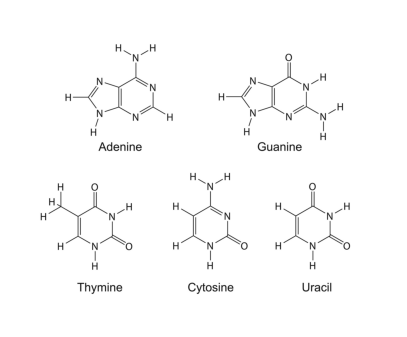

In [28]:
from PIL import Image
import matplotlib.pyplot as plt

bases_img_path = '../../img/nitrogenous-bases.jpg'
bases_img = Image.open(bases_img_path)
plt.figure(figsize=(5, 5))
plt.imshow(bases_img)
plt.axis('off')
plt.show()

In [29]:
with open(bases_img_path, 'rb') as f:
    image_bytes = f.read()

ask(prompt=[types.Part.from_bytes(data=image_bytes, mime_type='image/jpeg'), 'What do you see in this image?'])

This image displays the chemical structures of five nitrogenous bases, which are fundamental components of DNA and RNA. Each structure is clearly labeled with its common name:

1.  **Adenine**: A purine base, characterized by a fused five-membered and six-membered ring system, with an amino group attached to the six-membered ring.
2.  **Guanine**: Also a purine base, featuring the same fused ring system as adenine but with an amino group and a carbonyl group.
3.  **Thymine**: A pyrimidine base, identified by a single six-membered ring with two carbonyl groups and a methyl group.
4.  **Cytosine**: A pyrimidine base, composed of a six-membered ring with one carbonyl group and one amino group.
5.  **Uracil**: A pyrimidine base, similar to thymine but lacking the methyl group, featuring a six-membered ring with two carbonyl groups.

The image is well-rendered with clear lines and labels, making the structures easy to distinguish.

Gemini can also do object detection. Let's try it on the images with chemical structures.

In [30]:
import json

prompt = "Detect the all of the chemical structures in the image. "
"Pay close attention to outermost atoms. The box_2d should be [ymin, xmin, ymax, xmax] normalized to 0-1000."

# This config sets the response type to be JSON
config = types.GenerateContentConfig(
    response_mime_type="application/json"
) 

r = send_msg(prompt=[bases_img, prompt], config=config)

width, height = bases_img.size
bounding_boxes = json.loads(r.text)

converted_bounding_boxes = []
for bounding_box in bounding_boxes:
    abs_y1 = int(bounding_box["box_2d"][0]/1000 * height)
    abs_x1 = int(bounding_box["box_2d"][1]/1000 * width)
    abs_y2 = int(bounding_box["box_2d"][2]/1000 * height)
    abs_x2 = int(bounding_box["box_2d"][3]/1000 * width)
    converted_bounding_boxes.append([abs_x1, abs_y1, abs_x2, abs_y2])

print("Image size: ", width, height)
print("Bounding boxes:", converted_bounding_boxes)

Image size:  4508 3695
Bounding boxes: [[617, 369, 1920, 1481], [1018, 1533, 1528, 1670], [2398, 365, 3890, 1518], [2862, 1540, 3399, 1670], [338, 1998, 1433, 3037], [775, 3166, 1307, 3299], [1875, 1884, 2763, 3040], [2060, 3159, 2605, 3299], [3060, 2002, 3958, 3026], [3065, 3170, 3737, 3295]]


In this example, we set the response type as json to use structured output. We will go over more on that later. We got five bounding boxes from the response. It looks promising. Let's plot the bounding boxes on the image.

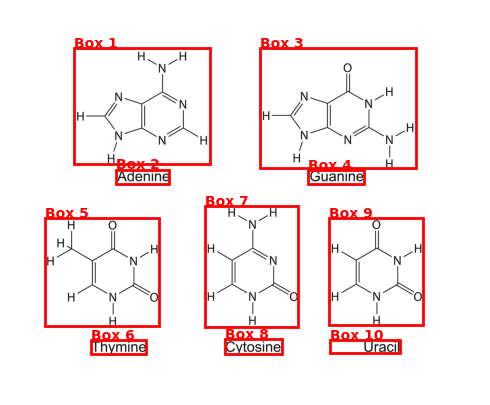

In [31]:
import matplotlib.patches as patches

fig, ax = plt.subplots(1, 1, figsize=(5, 5))
ax.imshow(bases_img)

for i, bbox in enumerate(converted_bounding_boxes):
    x1, y1, x2, y2 = bbox
    rect = patches.Rectangle((x1, y1), x2-x1, y2-y1, linewidth=2, edgecolor='red', facecolor='none')
    ax.add_patch(rect)
    ax.text(x1, y1-5, f'Box {i+1}', color='red', fontsize=10, weight='bold')

ax.set_xlim(0, width)
ax.set_ylim(height, 0)
ax.axis('off')
plt.tight_layout()
plt.show()

That is pretty awesome. With this ability, it would be very convenient to create anki cards to study. For more image realted tasks such as segmentation, uploading files, etc. please refer to the [Gemini documentation](https://ai.google.dev/gemini-api/docs/image-understanding).

## Text to speech

Let's do some cool thing where we ask gemini to read text out loud. You can also try out this feature in the [AI studio](https://aistudio.google.com/generate-speech). We've been using Gemini 2.5-flash, but we will switch to "gemini-2.5-flash-preview-tts". Here is Gemini reading a blog post on [OMEGA: Can LLMs Reason Outside the Box in Math?](https://allenai.org/blog/omega).

In [135]:
import wave
from IPython.display import Audio

# Set up the wave file to save the output:
def wave_file(filename, pcm, channels=1, rate=24000, sample_width=2):
    with wave.open(filename, "wb") as wf:
        wf.setnchannels(channels)
        wf.setsampwidth(sample_width)
        wf.setframerate(rate)
        wf.writeframes(pcm)

prompt="""Say cheerfully: Large language models (LLMs) like GPT-4, Claude, and DeepSeek-R1
have made headlines for their impressive performance on mathematical competitions, 
sometimes approaching human expert levels or even exceeding it on Olympiad problems. 
Yet a fundamental question remains: Are they truly reasoning or are they just recalling 
familiar strategies without inventing new ones?""",

config=types.GenerateContentConfig(
    response_modalities=["AUDIO"],
    speech_config=types.SpeechConfig(
        voice_config=types.VoiceConfig(
            prebuilt_voice_config=types.PrebuiltVoiceConfig(voice_name='Kore')
        )
    ),
)

r = send_msg(
    prompt,
    model="gemini-2.5-flash-preview-tts",
    config=config,
)

data = r.candidates[0].content.parts[0].inline_data.data

wave_file('tts1.wav', data) # Saves the file to current directory

audio_file = 'tts1.wav'
display(Audio(audio_file))

We can also create a dialogue with mutliple people in it.

In [136]:
prompt = """TTS the following conversation between Teacher and Student:
         Teacher: "Alright class, today we're exploring Google's Gemini AI. Now, I know some of you think AI is just magic, but—"

Student: "Magic? Professor, I thought you said there's no such thing as magic in computer science. Are you telling me you've been lying to us this whole time?"

Teacher: chuckles "Touché, Sarah. Let me rephrase: Gemini might seem magical, but it's actually quite logical once you understand it. Think of it as a very sophisticated conversation partner."

Student: "A conversation partner that can also look at my photos, generate images, and call functions? Sounds like the kind of friend I need. Does it also do my homework?"

Teacher: "Well, it could help you understand concepts better. But let's start with the basics. Gemini uses something called 'system instructions' to set its behavior. It's like giving someone a role to play."

Student: "So if I tell it to be a pirate, it'll talk like one?"

Teacher: "Exactly! You could say 'You are a helpful pirate tutor' and it would explain calculus while saying 'ahoy matey.' The system instruction shapes its entire personality."

Student: "That's actually brilliant. So instead of getting boring explanations, I could have a Shakespeare character teach me physics?"

Teacher: "Now you're getting it! But here's where it gets interesting - Gemini can also process multiple types of input simultaneously. Text, images, audio, even video."

Student: "Wait, so I could show it a picture of my messy room and ask it to write a poem about entropy?"

Teacher: "Absolutely! That's called multimodal processing. But here's something even cooler - structured output. Instead of just getting text back, you can ask for specific formats like JSON."

Student: "JSON? You mean I could ask it to rate my terrible cooking and get back a proper data structure instead of just 'this looks questionable'?"

Teacher: laughs "Precisely! You could define a Recipe class with ratings, ingredients, and improvement suggestions. Very organized criticism."

Student: "Okay, but what about function calling? That sounds scary. Like, what if it decides to order pizza while I'm asking about math?"

Teacher: "Function calling is actually quite safe. You define exactly which functions it can use, like a toolbox. If you only give it a calculator function, it can't order pizza."

Student: "But what if I give it a pizza-ordering function?"

Teacher: "Then... well, you might get pizza. But that's on you, not the AI."

Student: "Fair point. What about this 'thinking' feature I heard about?"

Teacher: "Ah, that's fascinating! Gemini can show you its reasoning process. It's like seeing someone's rough draft before they give you the final answer."

Student: "So it's like looking at my brain when I'm solving a problem? That's either really cool or really terrifying."

Teacher: "More like watching a very organized person work through a problem step by step. You can even control how much thinking time it gets."

Student: "Can I give it infinite thinking time and see if it achieves consciousness?"

Teacher: "Let's not get ahead of ourselves. But you can set it to -1 for automatic thinking budget, which is pretty generous."

Student: "This is all great, but what about the practical stuff? Like, how do I actually use this thing?"

Teacher: "Simple! You get an API key, choose a model like gemini-2.0-flash, and start with client.models.generate_content(). The response comes back as text you can use immediately."

Student: "And if I want to have a longer conversation instead of just one-off questions?"

Teacher: "Use the chat interface with client.chats.create(). It remembers context, so you don't have to repeat yourself every time."

Student: "This sounds too good to be true. What's the catch?"

Teacher: "Well, you need to understand how to structure your requests properly. And like any tool, it's only as good as how you use it."

Student: "So basically, I need to learn how to talk to it properly?"

Teacher: "Exactly! Think of it as learning a new language - not programming language, but communication language. The better you get at asking questions, the better answers you'll get."

Student: "Alright, Professor, I'm convinced. When do we start building things with it?"

Teacher: "Right now! Let's start with a simple example and work our way up. Who knows? By the end of class, you might have your pirate physics tutor up and running."

Student: "Now that's what I call education!"""

config=types.GenerateContentConfig(
    response_modalities=["AUDIO"],
    speech_config=types.SpeechConfig(
        multi_speaker_voice_config=types.MultiSpeakerVoiceConfig(
            speaker_voice_configs=[
                types.SpeakerVoiceConfig(
                    speaker='Teacher',
                    voice_config=types.VoiceConfig(
                        prebuilt_voice_config=types.PrebuiltVoiceConfig(
                        voice_name='Kore',
                        )
                    )
                ),
                types.SpeakerVoiceConfig(
                    speaker='Student',
                    voice_config=types.VoiceConfig(
                        prebuilt_voice_config=types.PrebuiltVoiceConfig(
                        voice_name='Puck',
                        )
                    )
                ),
            ]
        )
    )
)

r = send_msg(
    prompt,
    model="gemini-2.5-flash-preview-tts",
    config=config
)

data = r.candidates[0].content.parts[0].inline_data.data

wave_file('tts2.wav', data)
display(Audio('tts2.wav'))

That was a pretty fun conversation. This is probably how Notebook LM is created. We can change the voice and other configurations. It might be fun to let Gemini go through databases in the company, create a summary, and talk about it. Very great for traveling. More infornation in the [documentation](https://ai.google.dev/gemini-api/docs/speech-generation).

## Thinking

By default, Gemini will think if it thinks it needs to, or not. By setting `include_thoughts=True`, we can take a look at the thinking part.

In [69]:
r = send_msg("what is 2+2?", config=types.GenerateContentConfig(
        thinking_config=types.ThinkingConfig(include_thoughts=True)
    ))
r.text

'2 + 2 = 4'

In [70]:
def display_thinking(r):
    for part in r.candidates[0].content.parts:
        if part.thought: print("Thought summary:"); display(Markdown(part.text))

In [71]:
display_thinking(r)

Thought summary:


**Simple Addition, Seeking Confirmation**

Okay, so I see the user is asking a straightforward arithmetic question: what's the sum of 2 and 2?  Frankly, it's almost too basic for my expertise, but it's important to provide a correct response.  I understand they're looking for the total, the result of adding these two numbers together.  It's a foundational concept, and I'll confirm that the answer is indeed what I know it to be.


We can also disable thinking by providing 0 thinking budget. Even if answer is complicated, it would just create a response without thinking. Response time is shorter, so if it is a simple task, this is recommended. By default `thinking_budget=-1`, which means dynamic thinking and thinks automatically. Or we can set a budget, such as 1024, which is a number of tokens.

In [78]:
r = send_msg(
    "What is the most important quality for people to express?",
    config=types.GenerateContentConfig(
        thinking_config=types.ThinkingConfig(thinking_budget=0)
    ),
)
Markdown(r.text)

That's a fascinating question, and one that people have debated for centuries! There's no single "most important" quality that everyone agrees on, as its significance often depends on individual values, cultural contexts, and the specific situation.

However, if I had to choose one quality that underpins many other positive traits and facilitates a harmonious existence, it would be **empathy**.

Here's why empathy could be considered the most important:

*   **Foundation for Connection:** Empathy allows us to understand and share the feelings of others. This understanding is the bedrock of all meaningful relationships, whether personal or professional.
*   **Drives Compassion and Kindness:** When we truly understand what someone else is going through, it naturally leads to a desire to help and alleviate their suffering. Compassion and kindness often flow from empathy.
*   **Promotes Effective Communication:** Empathy helps us tailor our communication to the other person's perspective, making us better listeners and more impactful communicators.
*   **Fosters Conflict Resolution:** By understanding the different viewpoints involved in a conflict, empathy can bridge divides and lead to more peaceful and constructive solutions.
*   **Encourages Ethical Behavior:** Empathy makes us consider the impact of our actions on others, which is crucial for ethical decision-making and preventing harm.
*   **Builds Inclusivity:** Empathy allows us to appreciate and respect differences, leading to more inclusive environments where everyone feels valued.
*   **Essential for Leadership:** Effective leaders need to understand the needs, motivations, and challenges of their team members to inspire and guide them effectively.

While other qualities like integrity, courage, resilience, or intelligence are undeniably valuable, empathy often serves as the catalyst that allows these qualities to be applied in a way that benefits others and contributes to a better world. Without empathy, even the most intelligent or courageous person might act in ways that are ultimately detrimental to human connection and well-being.

Ultimately, the "most important" quality is a deeply personal choice, but empathy makes a strong case for its foundational role in positive human interaction.

In [77]:
display_thinking(r)

For more informaiton about thinking with Gemini, take a look at [thinking documentation](https://ai.google.dev/gemini-api/docs/thinking).

## Structured output

By using structured output, it is possible to generate a response in a specific format. This can be useful for tasks such as data extraction, where the response needs to be in a specific format. The response can be in the form of a table, a list, or a dictionary. We will create a JSON response. Let's say we have some alient encounters we need to sort through. Using `pydantic`, we create a schema. It has `species_type`, `communication_method`, and so on.

In [34]:
from pydantic import BaseModel
from typing import List, Literal, Optional

class AlienContact(BaseModel):
    species_type: str
    communication_method: Literal["telepathy", "math", "interpretive_dance", "smell", "musical_tones", "color_patterns"]
    hostility_level: int
    technology_advancement: int
    cultural_exchange_items: List[str]
    probe_attempts: int
    universal_translator_needed: bool
    galactic_citizenship_offered: bool
    earth_invasion_likelihood: int
    special_abilities: List[str]
    home_planet_description: str

config=dict(response_mime_type="application/json", response_schema=list[AlienContact])

r = send_msg(
    """Generate 3 different alien encounter scenarios. Make them creative and fun - 
    one friendly, one neutral, one slightly concerning but not too scary.""",
    config=config
)

encounters: list[AlienContact] = r.parsed
for i, encounter in enumerate(encounters, 1):
    print(f"=== Encounter {i}: {encounter.species_type} ===")
    print(f"Communication: {encounter.communication_method}")
    print(f"Invasion likelihood: {encounter.earth_invasion_likelihood}%")
    print(f"Special abilities: {', '.join(encounter.special_abilities)}")
    print()

=== Encounter 1: Lumiflora ===
Communication: musical_tones
Invasion likelihood: 0%
Special abilities: photosynthetic empathy, bio-luminescent communication, terraforming through sonic vibrations

=== Encounter 2: Chronomandibles ===
Communication: math
Invasion likelihood: 2%
Special abilities: localized time manipulation, data absorption via touch, probability calculation

=== Encounter 3: Whisperkin ===
Communication: telepathy
Invasion likelihood: 6%
Special abilities: mimicry of thoughts and emotions, induce temporary hallucinations, phase through solid objects



In [35]:
import json
print(json.dumps(encounters[0].model_dump(), indent=2))

{
  "species_type": "Lumiflora",
  "communication_method": "musical_tones",
  "hostility_level": 1,
  "technology_advancement": 9,
  "cultural_exchange_items": [
    "harmonious frequencies",
    "glowing seeds",
    "recipes for light-based sustenance"
  ],
  "probe_attempts": 0,
  "universal_translator_needed": false,
  "galactic_citizenship_offered": true,
  "earth_invasion_likelihood": 0,
  "special_abilities": [
    "photosynthetic empathy",
    "bio-luminescent communication",
    "terraforming through sonic vibrations"
  ],
  "home_planet_description": "A verdant world bathed in multi-spectrum light, where giant bioluminescent flora form living cities and consciousness is shared through resonant frequencies."
}


As we can see, we got responses as json format. It is very useful feature. We can use it to create a database of alien encounters. We can also add those encounters into google sheets using function calls. We will create functions to add new rows to a google sheet with these data.

There are so much more we can do with structured output. It is also possible to extract information from resume, food recipes, and so on. You can find more in [documentation](https://ai.google.dev/gemini-api/docs/structured-output).

## Function calling

Function calling is very fun. Before we add our alient encounters into the google sheets, let's see how it works. We provide Gemini with what tools it can use. Then we can ask it to use one of those tools. Let's create a function that will add one to a number.

In [36]:
num = 0

def show_curr_num() -> int:
    """Show the current state of num"""
    return num

def add_one() -> str:
    """Add one to global variable num."""
    global num
    num += 1
    return f"num has been changed into {num}"

In [37]:
config = types.GenerateContentConfig(
    tools=[show_curr_num, add_one]
)
r = send_msg(
    "Use your tool loop to turn num into 5",
    config=config
)

r.text

'num has been turned into 5.'

In [38]:
num

5

As we can see, the number has been increased to 5 as we asked it to. Under the hood, Gemini decides whether to use a tool to respond to the prompt or not. If it can respond without tool, it answers, but if it chooses to, it calls the tool. Then it asks itself again whether it still needs to use additional tools or not. It will continue to use the tool until it is done. We can also look at the history of tool usage. This can give us an idea of what tools were used and when.

In [39]:
def get_tool_history(r):
    history = r.automatic_function_calling_history
    for i,entry in enumerate(history):
        if hasattr(entry, 'parts') and entry.parts:
            for part in entry.parts:
                if part.function_call: print(f"Tool call {i}: {part.function_call.name}({dict(part.function_call.args)})")
                if part.function_response: print(f"Tool response {i}: {part.function_response.response['result']}")

In [40]:
get_tool_history(r)

Tool call 1: show_curr_num({})
Tool response 2: 0
Tool call 3: add_one({})
Tool response 4: num has been changed into 1
Tool call 5: add_one({})
Tool response 6: num has been changed into 2
Tool call 7: add_one({})
Tool response 8: num has been changed into 3
Tool call 9: add_one({})
Tool response 10: num has been changed into 4
Tool call 11: add_one({})
Tool response 12: num has been changed into 5


Now that we know how function call works, let's use it to add our alien encounters into google sheets. We will use the function call to add a new row to the google sheet. First we need to get the authentication. To get the `service-account-key.json`, follow these steps:

1. Go to [Google Cloud Console](https://console.cloud.google.com/) → IAM & Admin → Service Accounts
2. Create a new service account or use existing one
3. Click on the service account → Keys → Add Key → Create New Key → JSON
4. Download and save as `static/service-account-key.json`
5. Enable Google Sheets API in your project
6. Share your Google Sheet with the service account email address (found in the JSON file)

In [43]:
from google.oauth2.service_account import Credentials as ServiceCredentials
from googleapiclient.discovery import build

SCOPES = ['https://www.googleapis.com/auth/spreadsheets']

def authenticate_sheets_service_account():
    creds = ServiceCredentials.from_service_account_file('/home/kappa/data/service-account-key.json', scopes=SCOPES)
    return build('sheets', 'v4', credentials=creds)

sheets_service = authenticate_sheets_service_account()

In [44]:
def read_sheet_data(spreadsheet_id: str, range_name: str) -> dict:
    "Read data from a Google Sheet range"
    try:
        result = sheets_service.spreadsheets().values().get(
            spreadsheetId=spreadsheet_id, range=range_name).execute()
        return dict(success=True, data=result.get('values', []), range=range_name)
    except Exception as e: return dict(success=False, error=str(e))

def write_sheet_data(spreadsheet_id: str, range_name: str, values: list[list[str]]) -> dict:
    "Write data to a Google Sheet range"
    try:
        body = dict(values=values)
        result = sheets_service.spreadsheets().values().update(
            spreadsheetId=spreadsheet_id, range=range_name, valueInputOption='RAW', body=body).execute()
        return dict(success=True, updated_cells=result.get('updatedCells'))
    except Exception as e: return dict(success=False, error=str(e))

def append_sheet_data(spreadsheet_id: str, range_name: str, values: list[list[str]]) -> dict:
    "Append data to a Google Sheet"
    try:
        body = dict(values=values)
        result = sheets_service.spreadsheets().values().append(
            spreadsheetId=spreadsheet_id, range=range_name, valueInputOption='RAW', body=body).execute()
        return dict(success=True, updated_range=result.get('updates', {}).get('updatedRange'))
    except Exception as e: return dict(success=False, error=str(e))

def get_sheet_info(spreadsheet_id: str) -> dict:
    "Get information about all sheets in a spreadsheet including their IDs"
    try:
        result = sheets_service.spreadsheets().get(spreadsheetId=spreadsheet_id).execute()
        sheets_info = [dict(title=sheet['properties']['title'], sheet_id=sheet['properties']['sheetId']) for sheet in result.get('sheets', [])]
        return dict(success=True, sheets=sheets_info)
    except Exception as e: return dict(success=False, error=str(e))

def delete_rows(spreadsheet_id: str, sheet_id: int, start_index: int, end_index: int) -> dict:
    "Delete rows from a sheet (0-indexed)"
    try:
        request = dict(deleteDimension=dict(range=dict(sheetId=sheet_id, dimension='ROWS', startIndex=start_index, endIndex=end_index)))
        result = sheets_service.spreadsheets().batchUpdate(spreadsheetId=spreadsheet_id, body=dict(requests=[request])).execute()
        return dict(success=True, replies=result.get('replies'))
    except Exception as e: return dict(success=False, error=str(e))

def delete_columns(spreadsheet_id: str, sheet_id: int, start_index: int, end_index: int) -> dict:
    "Delete columns from a sheet (0-indexed)"
    try:
        request = dict(deleteDimension=dict(range=dict(sheetId=sheet_id, dimension='COLUMNS', startIndex=start_index, endIndex=end_index)))
        result = sheets_service.spreadsheets().batchUpdate(spreadsheetId=spreadsheet_id, body=dict(requests=[request])).execute()
        return dict(success=True, replies=result.get('replies'))
    except Exception as e: return dict(success=False, error=str(e))

def extract_spreadsheet_id(url: str) -> str:
    "Extract spreadsheet ID from Google Sheets URL"
    return url.split('/d/')[1].split('/')[0] if '/d/' in url else url

In [45]:
spreadhseet_url = 'https://docs.google.com/spreadsheets/d/1yWZjT7Lu5CGRXY0et_TYDqoiylt9-MUjk2y0A_WtBLA/edit?gid=0#gid=0'
spreadhseet_url

'https://docs.google.com/spreadsheets/d/1yWZjT7Lu5CGRXY0et_TYDqoiylt9-MUjk2y0A_WtBLA/edit?gid=0#gid=0'

The google sheet needs to be shared with editor permission with anyone.

In [46]:
get_sheet_info(extract_spreadsheet_id(spreadhseet_url))

{'success': True, 'sheets': [{'title': 'Sheet1', 'sheet_id': 0}]}

In [48]:
encounters

[AlienContact(species_type='Lumiflora', communication_method='musical_tones', hostility_level=1, technology_advancement=9, cultural_exchange_items=['harmonious frequencies', 'glowing seeds', 'recipes for light-based sustenance'], probe_attempts=0, universal_translator_needed=False, galactic_citizenship_offered=True, earth_invasion_likelihood=0, special_abilities=['photosynthetic empathy', 'bio-luminescent communication', 'terraforming through sonic vibrations'], home_planet_description='A verdant world bathed in multi-spectrum light, where giant bioluminescent flora form living cities and consciousness is shared through resonant frequencies.'),
 AlienContact(species_type='Chronomandibles', communication_method='math', hostility_level=3, technology_advancement=8, cultural_exchange_items=['advanced algorithms', 'temporal anomaly data', 'schematics for spacetime navigation'], probe_attempts=1, universal_translator_needed=True, galactic_citizenship_offered=False, earth_invasion_likelihood=

Unfortunately, we cannot run the function calling with structured data in the same gemini call. We have to call it in two steps. First, we need to get the data using the schema then we can add that into the gemini call.

In [65]:
def add_encounters_to_sheets(spreadsheet_url: str, encounters_data: List[AlienContact]) -> dict:
    "Add the alient encounters data to a spreadsheet."
    try:       
        spreadsheet_id = extract_spreadsheet_id(spreadsheet_url)
        headers = [["Species", "Communication", "Hostility", "Tech Level", 
                    "Exchange Items", "Probes", "Translator Needed", "Citizenship", 
                    "Invasion Risk", "Abilities", "Home Planet"]]
        
        rows = []
        for e in encounters_data:
            row = [
                e.species_type,
                e.communication_method,
                str(e.hostility_level),
                str(e.technology_advancement),
                ', '.join(e.cultural_exchange_items),
                str(e.probe_attempts),
                str(e.universal_translator_needed),
                str(e.galactic_citizenship_offered),
                str(e.earth_invasion_likelihood),
                ', '.join(e.special_abilities),
                e.home_planet_description
            ]
            rows.append(row)
        
        write_result = write_sheet_data(spreadsheet_id, 'A1:K1', headers)
        if not write_result['success']:
            return write_result
            
        append_result = append_sheet_data(spreadsheet_id, 'A2:K', rows)
        return dict(success=True, encounters_added=len(encounters_data), sheet_result=append_result)
        
    except Exception as e:
        return dict(success=False, error=str(e))

In [66]:
def show_alien_encounters() -> List[AlienContact]:
    "Show a list of alien encounters in `AlienContact` format."
    return encounters

In [67]:
config = types.GenerateContentConfig(
    tools=[add_encounters_to_sheets, extract_spreadsheet_id, 
           write_sheet_data, append_sheet_data, show_alien_encounters])
r = send_msg(f"Use `show_alien_encounters` to grab encounter data and add the alien encounters data from a list of encounters to {spreadhseet_url}", 
             config=config)
print(r.text)

The alien encounters data has been successfully added to the spreadsheet.


That was awesome. We added the data into Google Sheets. I have added functions to delete rows and so on, so play around with it for fun. 

Let's do another example where we go through urls in websites to find information we need. Let's say we want to find information about Marie Curie, but don't want to go through whole deep research as it takes a long time and finds so many articles. We want to only look at couple wikipedia articles and call it a day. Let's find some information about Marie Curie.

In [102]:
from httpx import get as xget

def read_url(url:str):
    "read a markdown version of url using jina.ai"
    out = xget(url, follow_redirects=True).text
#     if len(out) > 10000: return f"{out[:10000]}\n**TRUNCATED**"
    return out

def read_jina(url:str):
    "read a markdown version of url using jina.ai"
    return xget(f'https://r.jina.ai/{url}', follow_redirects=True).text

Using jina gives us markdown version of the website, which is more readable. However, the service is down due to DDOS attack right now. By using `read_url` we can grab html of the website.

In [103]:
wiki_article = read_url('https://en.wikipedia.org/wiki/Marie_Curie')
print(wiki_article[:1000])

<!DOCTYPE html>
<html class="client-nojs vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature-custom-font-size-clientpref-1 vector-feature-appearance-pinned-clientpref-1 vector-feature-night-mode-enabled skin-theme-clientpref-day vector-sticky-header-enabled vector-toc-available" lang="en" dir="ltr">
<head>
<meta charset="UTF-8">
<title>Marie Curie - Wikipedia</title>
<script>(function(){var className="client-js vector-feature-language-in-header-enabled vector-feature-language-in-main-page-header-disabled vector-feature-page-tools-pinned-disabled vector-feature-toc-pinned-clientpref-1 vector-feature-main-menu-pinned-disabled vector-feature-limited-width-clientpref-1 vector-feature-limited-width-content-enabled vector-feature

In [124]:
config = types.GenerateContentConfig(
    tools=[read_url])
r = send_msg(f"Can you find out what Marie Curie accomplished and how that impacted other scientists from wikipedia?"
             " Use `read_url` function call to find out more about at least 3 different scientists from urls"
             "listed in the article."
             "Look through their biographies carefully.", 
             config=config)
Markdown(r.text)

Marie Curie's accomplishments were monumental:

*   **Discovery of New Elements:** She, along with her husband Pierre Curie, discovered two new radioactive elements: polonium (named after her native Poland) and radium.
*   **Pioneering Research in Radioactivity:** She conducted extensive research into radioactivity, a term she coined. Her systematic studies using an electrometer (developed by her husband and his brother) showed that the activity of uranium compounds depended solely on the quantity of uranium present, leading her to hypothesize that radiation came from the atom itself, a crucial step in disproving the idea of indivisible atoms.
*   **Isolation of Radium:** She successfully isolated pure radium metal in 1910, a very challenging process involving processing tonnes of pitchblende.
*   **Medical Applications of Radioactivity:** Under her direction, the world's first studies were conducted into the treatment of neoplasms (tumors) using radioactive isotopes. During World War I, she developed and deployed mobile radiography units ("Little Curies") to provide X-ray services at field hospitals, revolutionizing battlefield medicine.
*   **First Woman Nobel Laureate and Only Person in Two Scientific Fields:** She was the first woman to win a Nobel Prize (Physics, 1903), the first person to win a Nobel Prize twice, and the only person to win Nobel Prizes in two different scientific fields (Physics in 1903 and Chemistry in 1911).
*   **Founding of Research Institutes:** She founded the Curie Institute in Paris (1920) and the Curie Institute in Warsaw (1932), which became major medical research centers and nurtured future Nobel laureates.

Marie Curie's work had a profound impact on other scientists:

1.  **Pierre Curie:** Her husband was her closest collaborator. Their mutual passion for science led them to work together extensively. Pierre joined Marie in her research into uranium rays, and they jointly discovered polonium and radium. He was a co-recipient of the 1903 Nobel Prize in Physics with Marie and Henri Becquerel, recognizing their joint researches on radiation phenomena. His support and collaboration were crucial to her early discoveries.

2.  **Henri Becquerel:** Becquerel discovered that uranium salts emitted rays. Marie Curie decided to investigate these "uranium rays" for her thesis, which led her to discover that the activity of uranium compounds depended only on the quantity of uranium, not external energy, suggesting the radiation came from the atom itself. Becquerel, along with Pierre and Marie Curie, was awarded the 1903 Nobel Prize in Physics for his discovery of spontaneous radioactivity, a field that Marie Curie significantly advanced and named.

3.  **Ernest Rutherford:** Curie's discovery of radium was instrumental to Rutherford's work. As stated in his biography, "Radium's radioactivity was so great that it could not be ignored. It seemed to contradict the principle of the conservation of energy and therefore forced a reconsideration of the foundations of physics. On the experimental level, the discovery of radium provided men like Ernest Rutherford with sources of radioactivity with which they could probe the structure of the atom." Rutherford utilized these radioactive sources to conduct his famous gold foil experiment, which led to his postulation of the nuclear atom model. He later went on to identify the proton and theorize the neutron, fundamental contributions to nuclear physics.

Marie Curie's persistent dedication and groundbreaking discoveries not only reshaped the understanding of physics and chemistry but also provided essential tools and inspiration for subsequent generations of scientists, including her own daughter, Irène Joliot-Curie, who would also become a Nobel laureate in Chemistry.

In [125]:
def get_tool_calls(r):
    history = r.automatic_function_calling_history
    for i,entry in enumerate(history):
        if hasattr(entry, 'parts') and entry.parts:
            for part in entry.parts:
                if part.function_call: print(f"Tool call {i}: {part.function_call.name}({dict(part.function_call.args)})")

Instead of using `get_tool_history`, which includes tool calls and responses, we only look at the tool calls. Responses are too long.

In [126]:
get_tool_calls(r)

Tool call 1: read_url({'url': 'https://en.wikipedia.org/wiki/Marie_Curie'})
Tool call 3: read_url({'url': 'https://en.wikipedia.org/wiki/Ernest_Rutherford'})


As we can see, Gemini called multiple function calls using `read_url`. We can also use `read_url` on llms.txt as they have urls in there as well. As the model goes through llms.txt and finds links that could help with answering the prompt, it uses subsequent function calls. This way, llms.txt can be small and does not have to take up a lot of context window. Even with Gemini, which has 1M context window, this method allows adding more llms.txt for different applications.

There are so many things we can do with function calling, such as using APIs. We can also get weather using API on couple cities to visit for the weekend and create a fun plan for a trip.

For more information about function calling, check the Gemini documentation on [function calls](https://ai.google.dev/gemini-api/docs/function-calling).

## Google Search

Large language models are trained with a lot of data, and it is very expensive. Therefore, the models have knowledge cutoff, which means after that time, the model does not have knowledge of what happened after. For instance, Gemini 2.5 Flash has Knowledge cutoff of January 2025. Let's ask about an event happened after the knowledge cutoff date. 

For more information about the Gemini 2.5 Flash, take a look at the [model card](https://ai.google.dev/gemini-api/docs/models#gemini-2.5-flash).

In [129]:
ask('Who is the new pope in July 2025?')

There is no new pope scheduled for July 2025.

As of today, Pope Francis is still the reigning pontiff. Popes serve for life unless they resign or pass away, and there have been no announcements or indications of either event occurring before that date.

Gemini does not know about the new Pope in 2025. Let's provide it with a tool that to search the web for answers.

In [132]:
grounding_tool = types.Tool(google_search=types.GoogleSearch())
config = types.GenerateContentConfig(tools=[grounding_tool])

r = send_msg('Who is the new pope in July 2025?', config=config)
Markdown(r.text)

As of July 2025, the new Pope is Leo XIV. He was elected on May 8, 2025, succeeding Pope Francis, who passed away on April 21, 2025, at the age of 88.

Pope Francis served as the head of the Catholic Church from March 13, 2013, until his death. He was the first Jesuit pope, the first from Latin America, and the first born or raised outside Europe since the 8th century.

Pope Leo XIV has released his prayer intention for July 2025, focusing on "formation in discernment." His upcoming schedule for August and September 2025 includes celebrating Holy Mass for the Jubilee of Youth and the canonization of Blessed Pier Giorgio Frassati and Blessed Carlo Acutis.

That's better. The response also includes citations. Here is `add_citations` from the documentations. 

In [133]:
def add_citations(response):
    text = response.text
    supports = response.candidates[0].grounding_metadata.grounding_supports
    chunks = response.candidates[0].grounding_metadata.grounding_chunks
    sorted_supports = sorted(supports, key=lambda s: s.segment.end_index, reverse=True)

    for support in sorted_supports:
        end_index = support.segment.end_index
        if support.grounding_chunk_indices:
            citation_links = []
            for i in support.grounding_chunk_indices:
                if i < len(chunks):
                    uri = chunks[i].web.uri
                    citation_links.append(f"[{i + 1}]({uri})")
            citation_string = ", ".join(citation_links)
            text = text[:end_index] + citation_string + text[end_index:]

    return text

In [134]:
Markdown(add_citations(r))

As of July 2025, the new Pope is Leo XIV. He was elected on May 8, 2025, succeeding Pope Francis, who passed away on April 21, 2025, at the age of 88.[1](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQEnoeRpWdN30fE1cdJoVkURh8dwbxfvvrWFBok1o3TaOejyrrrgLSliNpOD_a8gPoUuigEFDWACJXgEOQxZIYMGBNP7O2PSIHUQxJeswNQ2Dpk1RBZi-PyKfjTTQuLZM5ZvfgXb)

Pope Francis served as the head of the Catholic Church from March 13, 2013, until his death.[1](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQEnoeRpWdN30fE1cdJoVkURh8dwbxfvvrWFBok1o3TaOejyrrrgLSliNpOD_a8gPoUuigEFDWACJXgEOQxZIYMGBNP7O2PSIHUQxJeswNQ2Dpk1RBZi-PyKfjTTQuLZM5ZvfgXb) He was the first Jesuit pope, the first from Latin America, and the first born or raised outside Europe since the 8th century.[1](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQEnoeRpWdN30fE1cdJoVkURh8dwbxfvvrWFBok1o3TaOejyrrrgLSliNpOD_a8gPoUuigEFDWACJXgEOQxZIYMGBNP7O2PSIHUQxJeswNQ2Dpk1RBZi-PyKfjTTQuLZM5ZvfgXb)

Pope Leo XIV has released his prayer intention for July 2025, focusing on "formation in discernment."[2](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQGlhJtkHvR2Vu-gIBs9eDoQK6z5VpvunoumVF9l_YZsxlKzz7voRAhm7eG1hCE91t8j031bdaP24N-pMOFOgZyT8OuSwRxaZjfiyzfQ9cJQXGn-e5eq9rmlx6sc_jn8GeV5iSa8Nog7YVIjwE0i0oWd4xQ0jrVqeQl1qB0nMmXW9zW7obVh8QLSySDiYT7dOiLf29QeqCzvbYL5HH2Fuve_ldijFlHfpw==), [3](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQHDpGtkR84JZpRaKGDDzxqb5KHZqTRojxiYiQKKZHuU4FYbWPTolBDEm6cJ6cvCrAtaMGCfucwIyhzFFYIcqOD9zGm6UIK_bbJ2T2miU_-cEprxLHpbtyEK-piL6rG_GmbdxyB1QQsXSPIXcKXvzqpWsMD8rrlv7R7_mJeIV9f-8_yAfmYxRTbRyTQhEI5XIVP-WfWZi6hgBmXqzK0N7UAfyGll64Pn), [4](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQFRaLr1fu-fW1BeCakWIC1zDYVmNDL_igo5DVQ3DkPRuvCRxvdoqh1L7ak_yWadUW4CCTD9luELjbdAOCdD8BTK8MS74D1jzQXCNLLop9G9zuCiltWuINCjucTjk_hZgucLrvgr), [5](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQEDnnbSa73SZQvHdhn4YS7o81nA3aXlSEdI46otz_gR6d_lJ8PxG-X1N0Ev98JBwir46AOAVLPPMiqAkzJJznjWAL0eWJEmLD7675d0wsjVa82-aDQe-Sh-3fGH7aB-dRcYJgL5MiIWCxeBUqEholSlhaDRXG8=) His upcoming schedule for August and September 2025 includes celebrating Holy Mass for the Jubilee of Youth and the canonization of Blessed Pier Giorgio Frassati and Blessed Carlo Acutis.[6](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQHD24EbTxxPt9qjUv8Md4Njr41QwQvvJk3Vc9zoRD8FRbuJeP0lGOMUwLC4m_nanabIGN8Pta3Gke-3PYe7dILwTI5TNRTdXq7KuVr9VCY9up1n2MkhIdmyaGHpUIvbUbGyQznaDk_qjrQ4qt7ciE5aGiMxgGLm87riwNP2pHUaLPYhNYc8qZ3pdWIwAM_WqU25wfhHxgKCRTaVfGNV_1LThkuEWGLT4J7gxv6ESo80)

 That is very cool. Unfortunately, we cannot look at the tool history as of right now in July 2025. For more information about the search feature, check out the [documentation](https://ai.google.dev/gemini-api/docs/google-search).

## Conclusion

In this blog, we looked at how to use gemini-2.5-flash and gemini-2.5-flash-preview-tts for text to speech. 

We covered the following topics:

- Using system instructions
- Chat
- Image inputs
- Text to speech
- Thinking
- Structured outputs
- Function calling
- Google search

It was very fun to play around with different features. 

There are more information in the [gemini documentation](https://ai.google.dev/gemini-api/docs) and [cookbook](https://github.com/google-gemini/cookbook). 